GAN - Ayesh Madushanka MAhamada Kalapuwage

First, look at the code for the generator and discriminator/critic. Adjust the architecture to also sample from one hot encodings and use embeddings of class encodings (like in the LS-GAN paper). Use this same one hot encoding (both sampled and from the actual classes) in the discriminator/critic.  This GAN will be your base implementation--run this for at least 500 epochs (ideally more).

In [ ]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data

import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.autograd as autograd
from torch.autograd import Variable

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

# Seed control, for better reproducibility
# NOTE: this does not gurantee results are always the same
seed = 22
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
    # generator.cuda()
    # discriminator.cuda()
    # adversarial_loss.cuda()
    Tensor = torch.cuda.FloatTensor
else:
    device = torch.device("cpu")
    cudnn.benchmark=False
    Tensor = torch.FloatTensor

print(device)

EPOCHS = 500



cuda:0


In [ ]:
def imshow(img):
    # custom show in order to display
    # torch tensors as numpy
    npimg = img.numpy() / 2 + 0.5 # from tensor to numpy
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

batch_size = 250 # might try to use large batches (we will discuss why later when we talk about BigGAN)
# NOTE: the batch_size should be an integer divisor of the data set size  or torch
# will give you an error regarding batch sizes of "0" when the data loader tries to
# load in the final batch

dataset = dset.CIFAR10(root='data/cifar/', download=True,
                       transform=transforms.Compose([
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                       ]))

# frogs are the sixth class in the dataset
classes = ['plane', 'car', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck']
frog = [2 ,3 ]
frog_index = [i for i, x in enumerate(dataset.targets) if x in frog]
print("number of frog imgs: ", len(frog_index))

frog_set = torch.utils.data.Subset(dataset, frog_index)


dataloader = torch.utils.data.DataLoader(frog_set, batch_size=batch_size,
                                         shuffle=True, num_workers=1)

Files already downloaded and verified
number of frog imgs:  10000


I used 2 classes Birds and cats.

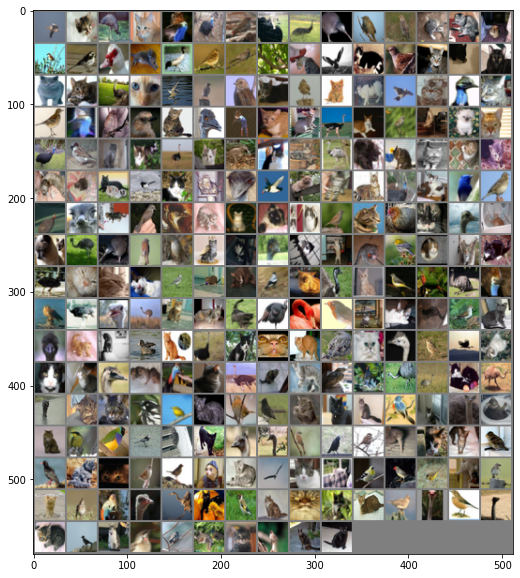

Image shape:  torch.Size([3, 32, 32])


In [ ]:
# get some random training images
dataiter = iter(dataloader)
real_image_examples, labelss = dataiter.next()

# show images
plt.figure(figsize=(10,10))
imshow(torchvision.utils.make_grid(real_image_examples, nrow=int(np.sqrt(batch_size))))
print("Image shape: ", real_image_examples[0].size())


In [ ]:
# create Utils functions for saving and loading
def save_checkpoint(new_img_list, loaded_ims, g_model, d_model, file_prefix):
    # save off a checkpoint of the current models and images

    # convert to numpy images for saving
    ims = np.array([np.transpose(np.hstack((i,real_image_numpy)), (2,1,0)) for i in new_img_list])

    # if we have saved images from another run, concatenate and save them here
    if len(loaded_ims)>0:
        ims = np.concatenate((loaded_ims,ims)) # concatenate these images with other runs (if needed)

    np.save(f'models/gan_models/{file_prefix}_images.npy',ims)

    # save the state of the models (will need to recreate upon reloading)
    torch.save({'state_dict': g_model.state_dict()}, f'models/gan_models/{file_prefix}_gen.pth')
    torch.save({'state_dict': d_model.state_dict()}, f'models/gan_models/{file_prefix}_dis.pth')

def load_checkpoint(file_prefix, gen_func, disc_func):
    # load up checkpoint images from previous runs
    ims = np.load(f'models/gan_models/{file_prefix}_images.npy')

    generator = gen_func() # create generator (no weights)
    discriminator = disc_func() # create disciminator (no weights)

    # now populate the weights from a previous training
    checkpoint = torch.load(f'models/gan_models/{file_prefix}_gen.pth')
    generator.load_state_dict(checkpoint['state_dict'])

    checkpoint = torch.load(f'models/gan_models/{file_prefix}_dis.pth')
    discriminator.load_state_dict(checkpoint['state_dict'])

    return ims, generator, discriminator

In [ ]:
latent_dim = 32
height = 32
width = 32
channels = 3
n_classes = 2
embedding_dim = 20




class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        # save these two functions

        # First, transform the input into a 8x8 128-channels feature map
        self.init_size = width // 4 # one quarter the image size
        self.l1 = nn.Sequential( nn.Linear(32, 128 * self.init_size ** 2))
        self.one_hot_condition = nn.Sequential(nn.Embedding(n_classes, embedding_dim), nn.Linear(embedding_dim, self.init_size*self.init_size))
        # there is no reshape layer, this will be done in forward function
        # alternately we could us only the functional API
        # and bypass sequential altogether

        # we will use the sequential API
        # in order to create some blocks
        self.conv_blocks = nn.Sequential(
            nn.Conv2d(129, 128, 3, padding=1), #16x16
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False), #16x16
            #nn.Conv2d(129, 128, 3, padding=1), #16x16

            # Then, add a convolution layer
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            # Upsample to 32x32
            # Transpose is not causing problems, but is slowing down because stride default 1
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False), # 32x32
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1),
            #nn.ConvTranspose2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            # Produce a 32x32xRGB-channel feature map
            nn.Conv2d(64, channels, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    def forward(self, z, one_hot):
        label_out = self.one_hot_condition
        label_out = label_out(one_hot)
        latent_out = self.l1(z)
        latent_out = torch.reshape(latent_out, (latent_out.shape[0], 128, self.init_size, self.init_size))
        label_out = torch.reshape(label_out, (label_out.shape[0], -1, self.init_size, self.init_size))
        out = torch.cat((latent_out, label_out), dim=1)
        img = self.conv_blocks(out)
        return img



In [ ]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        self.one_hot_condition = nn.Sequential(nn.Embedding(n_classes, embedding_dim), nn.Linear(embedding_dim, 3*32*32)).cuda()

        self.model = nn.Sequential(
            nn.Conv2d(6, 16, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.3, inplace=True),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(128),
        )

        # The height and width of downsampled image
        ds_size = width // 2 ** 4
        # Classification layer
        self.classification_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, 1),
                                                  nn.Sigmoid())



    def forward(self, img, one_hot):

        one_hot_out = self.one_hot_condition(one_hot)
        one_hot_out = torch.reshape(one_hot_out, (-1, 3 , 32, 32))
        concat = torch.cat((img, one_hot_out), dim=1)
        img_out = self.model(concat)
        img_out = torch.flatten(img_out, start_dim=1)
        validity = self.classification_layer(img_out)
        return validity




In [ ]:
# custom weights initialization called on netG and netD
# this function from PyTorch's officail DCGAN example:
# https://github.com/pytorch/examples/blob/master/dcgan/main.py#L112
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02) # filters are zero mean, small STDev
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02) # batch norm is unit mean, small STDev
        # gamma starts around 1
        m.bias.data.fill_(0) # like normal, biases start at zero
        # beta starts around zero
    elif isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)

In [ ]:
generator = Generator()
discriminator = Discriminator()
if torch.cuda.is_available():
  device = torch.device("cuda:0")
  cudnn.benchmark=True
  generator.cuda()
  discriminator.cuda()
  #adversarial_loss.cuda()

In [ ]:
# To stabilize training, we use learning rate decay
# and gradient clipping (by value) in the optimizer.
clip_value = 1.0 # This value will use in the future training process since
                 # PyTorch didn't has the feature to set clipvalue for
                 # RMSprop optimizer.

# Could these be AdaM? Would that improve performance? :)
# Decay rate here might be a tad aggressive...
# set discriminator learning higher than generator
discriminator_optimizer = torch.optim.RMSprop(discriminator.parameters(),
                                              lr=0.0008, weight_decay=1e-8)

gan_optimizer = torch.optim.RMSprop(generator.parameters(), lr=0.0004, weight_decay=1e-8)

# THIS LINE OF CODE DEFINES THE FUNCTION WE WILL USE AS LOSS
adversarial_loss = torch.nn.MSELoss() # binary cross entropy
if torch.cuda.is_available():
  device = torch.device("cuda:0")
  cudnn.benchmark=True
  generator.cuda()
  discriminator.cuda()
  adversarial_loss.cuda()

In [ ]:
generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (one_hot_condition): Sequential(
    (0): Embedding(2, 20)
    (1): Linear(in_features=20, out_features=3072, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(6, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.3, inplace=True)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (classification_layer): Sequential(
    (0): Lin

In [ ]:
iterations = EPOCHS

# Sample random points in the latent space
plot_num_examples = 25
fixed_random_latent_vectors = torch.randn(plot_num_examples, latent_dim, device=device)
fixed_one_hot_encoding = Variable(Tensor(25, 1).fill_(1.0), requires_grad=False)
fixed_one_hot_encoding = fixed_one_hot_encoding.unsqueeze(1).long()
# fixed one hot encording here
img_list = []
total_steps = 0

real_image_numpy = np.transpose(torchvision.utils.make_grid(real_image_examples[:plot_num_examples,:,:,:], padding=2, normalize=False, nrow=5),(0,1,2))


In [ ]:
%%time

# optionally load the checkpoint data here from previous run
run_from_checkpoint = False
if not run_from_checkpoint:
    loaded_ims = []
else:
    loaded_ims, generator, discriminator = load_checkpoint('vanilla',
                                                       Generator,
                                                       Discriminator)
    total_steps = loaded_ims.shape[0]*10 # can get previous steps based on saved checkpoints

# Start training loop
for step in range(iterations):
    total_steps = total_steps+1
    generator.train()
    discriminator.train()
    for i, (imgs, labels) in enumerate(dataloader):

        k =labels

        #labels = labels.to(device)
        #labels = labels.unsqueeze(1).long()
        y = []
        for i in range(len(labels)):
          if k[i] == 3:
            y.append(0)
          else:
           y.append(1)
          labels =  torch.Tensor(y)
          labels = labels.unsqueeze(1).long().cuda()
          #print(labels)
        #===================================
        # GENERATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        gan_optimizer.zero_grad()

        # Sample random points in the latent space
        random_latent_vectors = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], 32))))
        random_one_hot =  Variable(Tensor(imgs.shape[0], 1).fill_(0.0))
        random_one_hot = random_one_hot.unsqueeze(1).long()
        #real_one_hot_labels = variable(torch.ones(imgs.shape[0],1))

        # n_samples = 250
        # n_classes = 2
        # qq = np.zeros((n_samples, n_classes))
        # J = np.random.choice(n_classes, n_samples)

        # # assign with advanced indexing
        # qq[np.arange(n_samples), J] = 1
        # #random_one_hot = random_one_hot.astype(np.float32)
        # random_one_hot = torch.from_numpy(qq)
        # random_one_hot = random_one_hot.type(torch.FloatTensor)
# generate random one hot encording here
        # Decode them to fake images, through the generator
        generated_images = generator(random_latent_vectors, random_one_hot)
        #print(generated_images.shape)

        # Assemble labels that say "all real images"
        misleading_targets = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)

        # Get BCE Loss function
        # E[log d(x_fake)]
        # want generator output to generate images that are "close" to all "ones"
        g_loss = adversarial_loss(discriminator(generated_images, labels), misleading_targets)
        #g_loss = 0.5 *( torch.mean((discriminator(generated_images)-1 ** 2 )), misleading_targets)


        # now back propagate to get derivatives
        g_loss.backward()

        # use gan optimizer to only update the parameters of the generator
        # this was setup above to only use the params of generator
        gan_optimizer.step()

        #===================================
        # DISCRIMINATOR OPTIMIZE AND GET LABELS

        # Zero out any previous calculated gradients
        discriminator_optimizer.zero_grad()

        # Combine real images with some generator images
        real_images = Variable(imgs.type(Tensor))

        # y = []
        # for i in range(0,len(d)):
        #   if labelss[i] == 3:
        #     y.append(0)
        #   else:
        #     y.append(1)
        #   real_one_hot_labels =  torch.Tensor(y)

# real one hot encording here
        combined_images = torch.cat([real_images, generated_images.detach()])

        # in the above line, we "detach" the generated images from the generator
        # this is to ensure that no needless gradients are calculated
        # those parameters wouldn't be updated (because we already defined the optimized parameters)
        # but they would be calculated here, which wastes time.

        # Assemble labels discriminating real from fake images
        labelss = torch.cat((
            Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False),
            Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)


        ))
        # Add small random noise to the labels - important trick!
        labelss += 0.05 * torch.rand(labelss.shape, device = device)

        # Setup Discriminator loss
        # this takes the average of BCE(real images labeled as real) + BCE(fake images labeled as fake)
        #  E[log d(x_real)] + E[log 1- d(x_fake)]
        d_loss = (
            adversarial_loss(discriminator(combined_images[:batch_size], labels ), labelss[:batch_size]) + \
            adversarial_loss(discriminator(combined_images[batch_size:], labels), labelss[batch_size:])
            ) / 2

        # get gradients according to loss above
        d_loss.backward()
        # optimize the discriminator parameters to better classify images
        discriminator_optimizer.step()

        # Now Clip weights of discriminator (manually)
        for p in discriminator.parameters():
            p.data.clamp_(-clip_value, clip_value)

        #===================================

    # Occasionally save / plot
    if step % 10 == 0:
        generator.eval()
        discriminator.eval()
        # Print metrics (TODO: these are actually binary cross entropy, not Disc outputs..)
        print('Loss at step %s: D(z_c)=%s, D(G(z_mis))=%s' % (total_steps, d_loss.item(),g_loss.item()))

        # save images in a list for display later
        with torch.no_grad():
            fake_output = generator(fixed_random_latent_vectors, fixed_one_hot_encoding).detach().cpu()
        img_list.append(torchvision.utils.make_grid(fake_output, padding=2, normalize=True, nrow=5))

        save_checkpoint(img_list, loaded_ims, generator, discriminator, 'vanilla')

Loss at step 1: D(z_c)=0.22412115335464478, D(G(z_mis))=0.39094576239585876
Loss at step 11: D(z_c)=0.0038159668911248446, D(G(z_mis))=0.8938185572624207
Loss at step 21: D(z_c)=0.0024063470773398876, D(G(z_mis))=0.9952893257141113
Loss at step 31: D(z_c)=0.0009071949170902371, D(G(z_mis))=0.999571681022644
Loss at step 41: D(z_c)=0.0006829211488366127, D(G(z_mis))=0.9768788814544678
Loss at step 51: D(z_c)=0.0008690961985848844, D(G(z_mis))=0.9998515248298645
Loss at step 61: D(z_c)=0.0008582251030020416, D(G(z_mis))=0.9995726943016052
Loss at step 71: D(z_c)=0.0008337715407833457, D(G(z_mis))=0.9999911189079285
Loss at step 81: D(z_c)=0.0008344504749402404, D(G(z_mis))=0.9999010562896729
Loss at step 91: D(z_c)=0.0006590950069949031, D(G(z_mis))=0.9840822815895081
Loss at step 101: D(z_c)=0.00084662064909935, D(G(z_mis))=0.9987343549728394
Loss at step 111: D(z_c)=0.000889224000275135, D(G(z_mis))=0.9999086260795593
Loss at step 121: D(z_c)=0.0008141089347191155, D(G(z_mis))=0.999784

Discriminator and Generator changed as you mentioned in the lab. CPU took me forever to run because I used GPU. Let's look at some Cat and Bird images.

In [ ]:
# save off everything at the end (same as the checkpoint)
save_checkpoint(img_list, loaded_ims, generator, discriminator, 'vanilla')

In [ ]:
# load the models (nice for showing results from previous run)
ims, generator, discriminator = load_checkpoint('vanilla', Generator, Discriminator)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


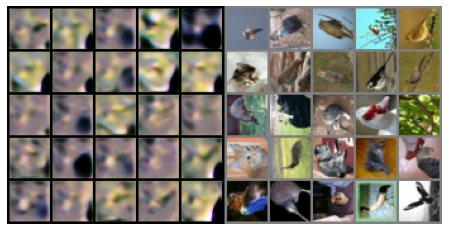

In [ ]:
def norm_grid(im):
    # first half should be normalized and second half also, separately
    im = im.astype(np.float)
    rows,cols,chan = im.shape
    cols_over2 = int(cols/2)
    tmp = im[:,:cols_over2,:]
    im[:,:cols_over2,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    tmp = im[:,cols_over2:,:]
    im[:,cols_over2:,:] = (tmp-tmp.min())/(tmp.max()-tmp.min())
    return im


fig = plt.figure(figsize=(12,4))
plt.axis("off")
pls = [[plt.imshow(norm_grid(im), animated=True)] for im in ims]
ani = animation.ArtistAnimation(fig, pls, interval=500, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

The model is not converged correctly but ih has managed to extract some features of the images and this is not exactly solid colour result. I don't think more epochs would be necesssary for this one because the loss both Discriminator and Generator were not changed significantly during the train. Anyways, I am going to try next 3 parts to get some good images.